<a href="https://colab.research.google.com/github/shuchimishra/Tensorflow_projects/blob/main/Tensorflow_Code/CNN/Landscape_classification_w_KerasTuner.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [22]:
#Install keras-tuner library; uncomment if necessary
!pip install keras-tuner -q

In [160]:
import zipfile
import os
import tensorflow as tf
from tensorflow import keras
import numpy as np
from keras import layers
from keras.optimizers import RMSprop, SGD, Adam
import keras_tuner

import warnings
warnings.filterwarnings("ignore")
import pathlib

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from random import randint

# Download data

In [24]:
zip_file = '/content/drive/MyDrive/Data Science & Machine Learning/Tensorflow Certification/Repository/Tensorflow_projects/Data/Landscape Dataset/Landscape.zip'

In [25]:
dir_path = './landscapes/'

In [26]:
handler = zipfile.ZipFile(zip_file, 'r')
handler.extractall(dir_path)
handler.close()

In [103]:
train_path = os.path.join(dir_path,'seg_train/seg_train')
val_path = os.path.join(dir_path,'seg_test/seg_test')
test_path = os.path.join(dir_path,'seg_pred/seg_pred')

# Setting Parameters

In [28]:
batch_size = 32
img_height = 150
img_width = 150

# Load datasets

In [29]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  train_path,
  label_mode = 'int',
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  val_path,
  label_mode = 'int',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 14034 files belonging to 6 classes.
Found 3000 files belonging to 6 classes.


# Check shape of data

In [30]:

for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  print(labels_batch)
  break

(32, 150, 150, 3)
(32,)
tf.Tensor([2 5 1 0 5 4 0 2 1 5 5 0 5 4 4 3 2 4 4 1 5 1 5 3 3 2 3 0 5 4 3 3], shape=(32,), dtype=int32)


# Derive classnames

In [31]:
class_names = train_ds.class_names
print(class_names)

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


# Visualize data

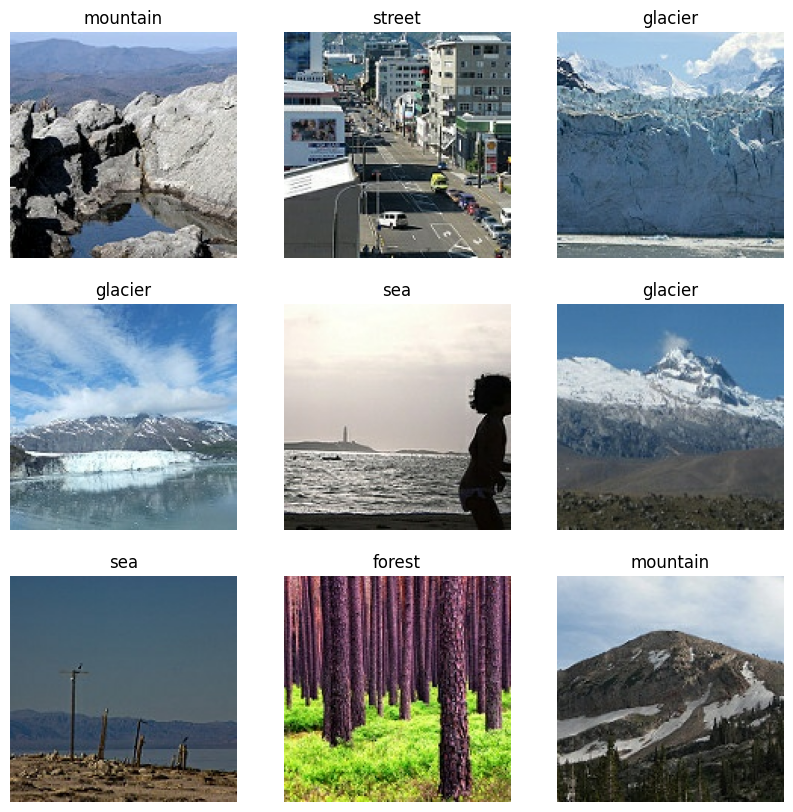

In [32]:

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  # print(labels)
  # labels = np.argmax(labels)
  # print(labels)
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    # print(labels[i])
    # labels = np.argmax(labels[i])
    # print(labels)
    plt.title(class_names[labels[i]])
    plt.axis("off")

# Normalize images

In [33]:
def preprocess(image, label):
  image = tf.cast(image, tf.float32)
  image = tf.image.resize(image,[img_height, img_width])
  image = image/255.0
  return image, label


In [34]:

train_ds = train_ds.map(
    preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE).prefetch(
    tf.data.experimental.AUTOTUNE)
val_ds = val_ds.map(
    preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)

# **Keras Hyperparameter tuning**

In [35]:
tf.keras.backend.clear_session()

In [36]:
n_classes = len(class_names)

In [37]:
#Build the model

def build_model(hp):

  inputs = tf.keras.Input(shape=(150, 150, 3))
  x = inputs

  # First Layer
  x = keras.layers.Conv2D(filters=hp.Choice("filters", values=[16,32,64,128,256]),kernel_size=(3,3), activation="relu")(x)
  x = keras.layers.MaxPooling2D(pool_size=(2, 2))(x)

  # Tune whether to use dropout.
  if hp.Boolean("dropout"):
    x = keras.layers.Dropout(rate=0.2)(x)

  #Second Layer
  x = keras.layers.Conv2D(
      filters = hp.Choice("filters", values=[16,32,64,128,256]),kernel_size=(3,3), activation="relu")(x)
  x = keras.layers.MaxPooling2D(pool_size=(2, 2))(x)

  # Tune whether to use dropout.
  if hp.Boolean("dropout"):
    x = keras.layers.Dropout(rate=0.2)(x)

  #Third Layer
  x = keras.layers.Conv2D(
      filters = hp.Choice("filters", values=[16,32,64,128,256]),kernel_size=(3,3), activation="relu")(x)
  x = keras.layers.MaxPooling2D(pool_size=(2, 2))(x)

  # Tune whether to use dropout.
  if hp.Boolean("dropout"):
    x = keras.layers.Dropout(rate=0.2)(x)

  #Fourth Layer
  x = keras.layers.Conv2D(
      filters = hp.Choice("filters", values=[16,32,64,128,256]),kernel_size=(3,3), activation="relu")(x)
  x = keras.layers.MaxPooling2D(pool_size=(2, 2))(x)

  # Tune whether to use dropout.
  if hp.Boolean("dropout"):
    x = keras.layers.Dropout(rate=0.2)(x)

  #Fifth Layer
  x = keras.layers.Conv2D(
      filters = hp.Choice("filters", values=[16,32,64,128,256]),kernel_size=(3,3), activation="relu")(x)
  x = keras.layers.MaxPooling2D(pool_size=(2, 2))(x)

  # Tune whether to use dropout.
  if hp.Boolean("dropout"):
    x = keras.layers.Dropout(rate=0.2)(x)

  #Mandatory Flatten layer
  x = keras.layers.Flatten()(x)

  # Tune whether to use dropout.
  if hp.Boolean("dropout"):
    x = keras.layers.Dropout(rate=0.2)(x)

  # Dense layers
  x = keras.layers.Dense(units=hp.Choice("filters", values=[16,32,64,128,256,512,1024]),activation="relu")(x)
  outputs = keras.layers.Dense(n_classes, activation='softmax')(x)

  #Stitch the model
  model_tune = tf.keras.Model(inputs, outputs)

  # Select optimizer
  optimizer=hp.Choice('optimizer', values=['adam', 'RMSprop', 'SGD'])

  # Conditional for each optimizer
  if optimizer == 'adam':
    learning_rate = hp.Float('lrate', min_value=1e-8, max_value=1e-1, sampling='LOG')

  elif optimizer == 'RMSprop':
    learning_rate = hp.Float('lrate', min_value=1e-8, max_value=1e-1, sampling='LOG')

  elif optimizer == 'SGD':
    learning_rate = hp.Float('lrate', min_value=1e-8, max_value=1e-1, sampling='LOG')
    momentum = hp.Float('momentum', min_value=0, max_value=1.0, step=0.1, sampling='linear')

  #compile the model
  model_tune.compile(optimizer=optimizer,
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])

  model_tune.summary()

  return model_tune

In [38]:
build_model(keras_tuner.HyperParameters())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 16)        2320      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 36, 36, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 16)        2320  

In [39]:
tuner = keras_tuner.BayesianOptimization( #can be Hyperband, RandomSearch, or BayesianOptimization
    hypermodel=build_model,
    objective="val_accuracy",
    max_trials=7,
    executions_per_trial=1,
    overwrite=True,
    directory="./Model-Tuner",
    project_name="KerasTuning",
)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 conv2d_5 (Conv2D)           (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 74, 74, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 72, 72, 16)        2320      
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 36, 36, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 34, 34, 16)        2320

In [40]:
#Print summary of search space
tuner.search_space_summary()

Search space summary
Default search space size: 4
filters (Choice)
{'default': 16, 'conditions': [], 'values': [16, 32, 64, 128, 256], 'ordered': True}
dropout (Boolean)
{'default': False, 'conditions': []}
optimizer (Choice)
{'default': 'adam', 'conditions': [], 'values': ['adam', 'RMSprop', 'SGD'], 'ordered': False}
lrate (Float)
{'default': 1e-08, 'conditions': [], 'min_value': 1e-08, 'max_value': 0.1, 'step': None, 'sampling': 'log'}


In [41]:
ES = keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    patience=3,
    verbose=0,
    mode="auto"
)

In [42]:
#Train the model
num_epochs = 10

history = tuner.search(train_ds,
          epochs=num_epochs, verbose=2,
          validation_data=val_ds,
                       callbacks=[ES, keras.callbacks.TensorBoard("./tb_logs")])

Trial 7 Complete [00h 00m 49s]
val_accuracy: 0.6296666860580444

Best val_accuracy So Far: 0.8266666531562805
Total elapsed time: 00h 15m 19s


# **View logs on Tensorboard**

In [43]:
#Code to see the results in Tensorboard

%load_ext tensorboard
# %reload_ext tensorboard

%tensorboard --logdir ./tb_logs

<IPython.core.display.Javascript object>

# **Query the results**

In [45]:
from keras_tuner.engine.hyperparameters import HyperParameters

# Get the top 2 models.
models = tuner.get_best_models(num_models=2)
best_model = models[0]
best_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 148, 148, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 128)       0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 74, 74, 128)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 128)       147584    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 36, 36, 128)       0         
 g2D)                                                        

In [46]:
tuner.results_summary()

Results summary
Results in ./Model-Tuner/KerasTuning
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 1 summary
Hyperparameters:
filters: 128
dropout: True
optimizer: RMSprop
lrate: 3.0296324693172478e-05
Score: 0.8266666531562805

Trial 5 summary
Hyperparameters:
filters: 64
dropout: False
optimizer: adam
lrate: 6.150314044849116e-08
momentum: 0.5
Score: 0.815666675567627

Trial 0 summary
Hyperparameters:
filters: 256
dropout: False
optimizer: adam
lrate: 0.002947326131856046
Score: 0.8116666674613953

Trial 2 summary
Hyperparameters:
filters: 64
dropout: False
optimizer: RMSprop
lrate: 0.00980789300851468
Score: 0.7953333258628845

Trial 4 summary
Hyperparameters:
filters: 32
dropout: True
optimizer: RMSprop
lrate: 5.325022217001304e-08
momentum: 0.30000000000000004
Score: 0.7856666445732117

Trial 3 summary
Hyperparameters:
filters: 64
dropout: False
optimizer: SGD
lrate: 3.7020770206540125e-06
momentum: 0.0
Score: 0.7176666855812073

Trial 6 summary
Hyp

In [47]:
# After hyperparameter tuning, retrieve the best hyperparameters.
best_hp = tuner.get_best_hyperparameters()[0]
best_hp.values

{'filters': 128,
 'dropout': True,
 'optimizer': 'RMSprop',
 'lrate': 3.0296324693172478e-05}

In [48]:
#save the model
best_model.save('./best/best_model.h5')
best_model.save('./best/best_model_new_version')

# # Save the hyperparameters separately to a JSON file.
# with open('./hyperparameters.json', 'w') as f:
#     f.write(best_hps.get_config())


# **Retrain the model(optional)**

In [51]:
# Build the model with the best hp.
model = build_model(best_hp)

num_epochs = 30
# Fit with the entire dataset.
history = model.fit(train_ds,
          epochs=num_epochs, verbose=2,
          validation_data=val_ds
                      #  ,callbacks=[ES, keras.callbacks.TensorBoard("/tmp/tb_logs")]
                    )

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 conv2d_10 (Conv2D)          (None, 148, 148, 128)     3584      
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 74, 74, 128)       0         
 ng2D)                                                           
                                                                 
 dropout_6 (Dropout)         (None, 74, 74, 128)       0         
                                                                 
 conv2d_11 (Conv2D)          (None, 72, 72, 128)       147584    
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 36, 36, 128)       0         
 ng2D)                                                     

# Accuracy and Loss Plot

In [52]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.fugure_format = 'retina'

def plot_loss_acc(history):
  #-----------------------------------------------------------
  # Retrieve a list of list results on training and test data
  # sets for each training epoch
  #-----------------------------------------------------------
  acc      = history.history[     'accuracy' ]
  val_acc  = history.history[ 'val_accuracy' ]
  loss     = history.history[    'loss' ]
  val_loss = history.history['val_loss' ]

  epochs   = range(len(acc)) # Get number of epochs

  #------------------------------------------------
  # Plot training and validation accuracy per epoch
  #------------------------------------------------
  plt.plot  ( epochs,     acc, label='Training accuracy' )
  plt.plot  ( epochs, val_acc, label='Validation accuracy' )
  plt.title ('Training and validation accuracy')
  plt.grid()
  plt.legend()
  plt.xlabel("Epochs")
  plt.ylabel("Accuracy")
  plt.figure()

  #------------------------------------------------
  # Plot training and validation loss per epoch
  #------------------------------------------------
  plt.plot  ( epochs,     loss, label='Training loss' )
  plt.plot  ( epochs, val_loss, label='Validation loss' )
  plt.grid()
  plt.legend()
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.title ('Training and validation loss'   )


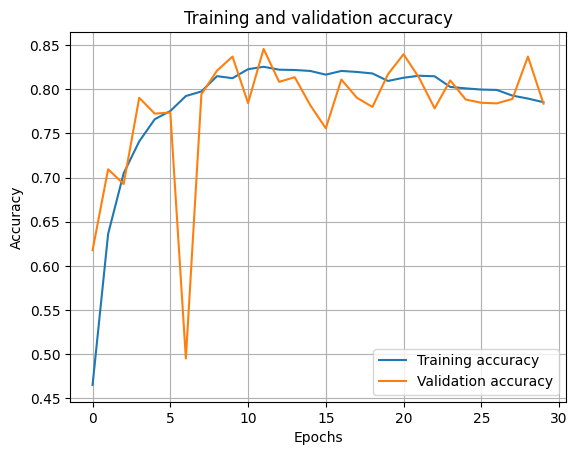

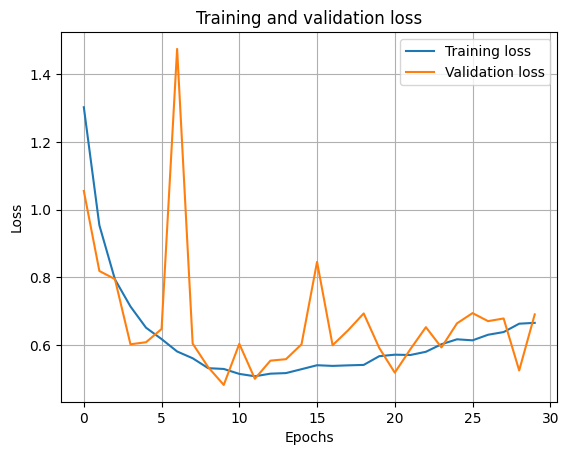

In [53]:
plot_loss_acc(history)

# Predict test data

In [145]:
def path_to_filelist(path, dataset_type):
  path = pathlib.Path(path).with_suffix('')

  if dataset_type=='validation':
    files = list(path.glob('*/*.jpg'))
  else:
    files = list(path.glob('*.jpg'))

  return files


# Derive images and labels from File path

In [121]:
label = np.arange(6)
label_dict = dict(zip(class_names, label))
print(label_dict)

{'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}


In [150]:
def image_label_arr(path, dataset_type='validation'):

  file_list = path_to_filelist(path, dataset_type)

  images,labels = [], []

  for file in file_list:

    #Convert Posixpath to string
    file_path = str(file)

    #Read the image file
    img = tf.io.read_file(file_path)
    img = tf.io.decode_jpeg(contents = img, channels = 3)

    if dataset_type=='validation':
      #Derive label from file path and code it
      label = (file_path.split('/')[-2])
      label_code = label_dict[label]

    else:
      label_code = np.zeros(len(file_list)) #we don't care about labels for testing data; this is just dummy array to have common function for validation and testing

    #Normalize the image
    image, label = preprocess(img, label_code)

    #Add to list
    images.append(image)
    labels.append(label)

  #converting the list to numpy array.
  images = np.array(images)
  labels = np.array(labels)

  return images, labels

In [151]:
val_images, val_labels = image_label_arr(val_path, 'validation')
test_images, _ = image_label_arr(test_path, 'testing')

In [152]:
print("Shape of Val Images:",val_images.shape)
print("Shape of Val Labels:",val_labels.shape)

print("Shape of test Images:",test_images.shape)

Shape of Val Images: (3000, 150, 150, 3)
Shape of Val Labels: (3000,)
Shape of test Images: (7301, 150, 150, 3)


# Evaluate accuracy of validation data

In [153]:
model.evaluate(val_images,val_labels, verbose=1)

94/94 [==============================] - 7s 70ms/step - loss: 0.6911 - accuracy: 0.7837


[0.6911126971244812, 0.7836666703224182]

# Predict and Visualize test data

In [163]:
def get_classlabel(class_code):
    labels = {2:'glacier', 4:'sea', 0:'buildings', 1:'forest', 5:'street', 3:'mountain'}

    return labels[class_code]

1/1 [==============================] - 0s 21ms/step


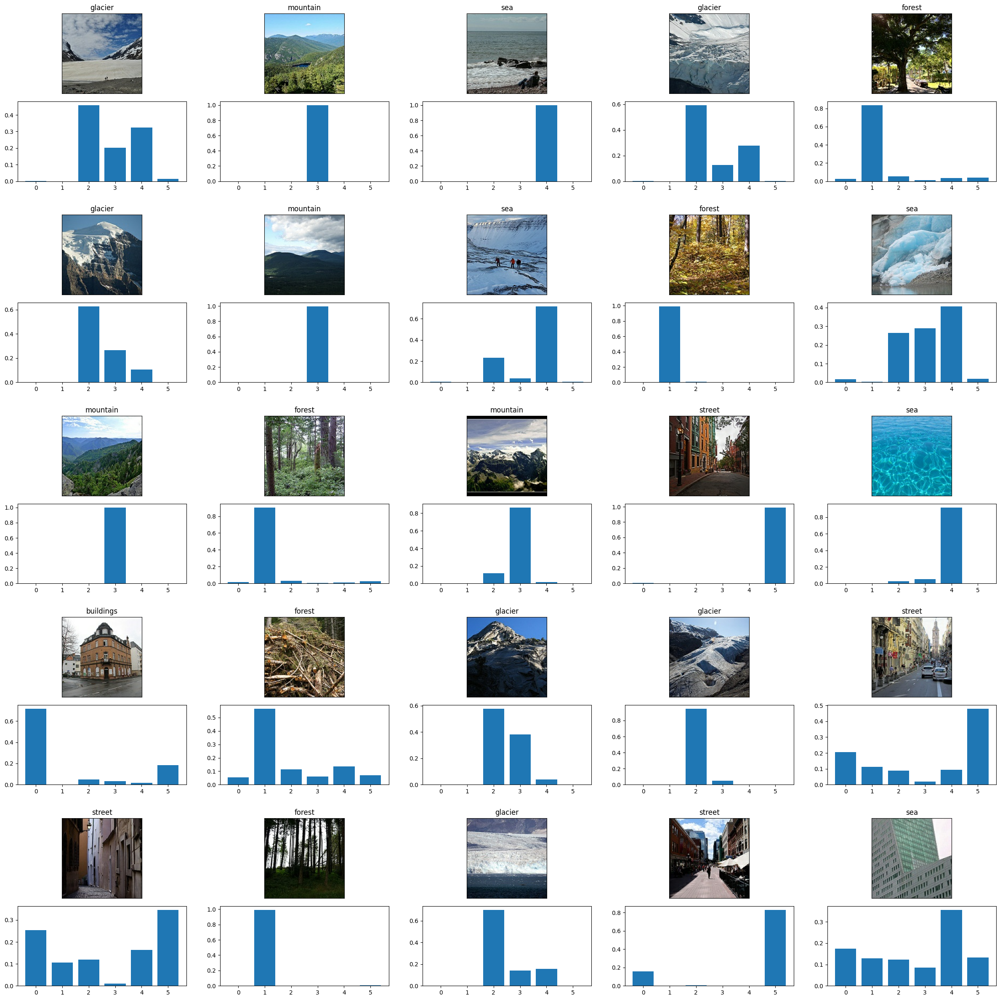

In [172]:
fig = plt.figure(figsize=(30, 30))
outer = gridspec.GridSpec(5, 5, wspace=0.2, hspace=0.2)

for i in range(25):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,subplot_spec=outer[i], wspace=0.1, hspace=0.1)
    rnd_number = randint(0,len(test_images))
    pred_image = np.array([test_images[rnd_number]])
    pred_class = get_classlabel(np.argmax(model.predict(pred_image)))
    pred_prob = model.predict(pred_image).reshape(6)
    for j in range(2):
        if (j%2) == 0:
            ax = plt.Subplot(fig, inner[j])
            ax.imshow(pred_image[0])
            ax.set_title(pred_class)
            ax.set_xticks([])
            ax.set_yticks([])
            fig.add_subplot(ax)
        else:
            ax = plt.Subplot(fig, inner[j])
            ax.bar([0,1,2,3,4,5],pred_prob)
            fig.add_subplot(ax)


fig.show()